In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import math
from pandas_profiling import ProfileReport


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/household-electrical-consumption/household_power_consumption.txt


## Attribute Information:

1.date: Date in format dd/mm/yyyy

2.time: time in format hh:mm:ss

3.global_active_power: household global minute-averaged active power (in kilowatt)

4.global_reactive_power: household global minute-averaged reactive power (in kilowatt)

5.voltage: minute-averaged voltage (in volt)

6.global_intensity: household global minute-averaged current intensity (in ampere)

7.sub_metering_1: energy sub-metering No. 1 (in watt-hour of active energy). It corresponds to the kitchen, containing mainly a dishwasher, an oven and a microwave (hot plates are not electric but gas powered).

8.sub_metering_2: energy sub-metering No. 2 (in watt-hour of active energy). It corresponds to the laundry room, containing a washing-machine, a tumble-drier, a refrigerator and a light.

9.sub_metering_3: energy sub-metering No. 3 (in watt-hour of active energy). It corresponds to an electric water-heater and an air-conditioner.



> **Note: This work is focused on predcting the sum sub_metering  energy of the household**

# Load Dataset

In [2]:
data = pd.read_csv("../input/household-electrical-consumption/household_power_consumption.txt", sep=";", parse_dates=[['Date', 'Time']])

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (2,3,4,5,6,7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
data_report = ProfileReport(data, title = "Data_Report")


In [4]:
data_report.to_widgets()

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
data_report.to_file("rawdataprofile.html")

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df = data.copy()
df

,Date_Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,2006-12-16 17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0
1,2006-12-16 17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0
2,2006-12-16 17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0
3,2006-12-16 17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0
4,2006-12-16 17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0
...,...,...,...,...,...,...,...,...
2075254,2010-11-26 20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0
2075255,2010-11-26 20:59:00,0.944,0.0,240.0,4.0,0.0,0.0,0.0
2075256,2010-11-26 21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0
2075257,2010-11-26 21:01:00,0.934,0.0,239.7,3.8,0.0,0.0,0.0


# Rename Columns & Handle Missing Data

In [7]:
df.rename(columns = {"Date_Time": "datetime", "Global_active_power": "gap", "Global_reactive_power": "grp", "Voltage" : "voltage",
                     "Global_intensity": "gi", "Sub_metering_1": "sm1", "Sub_metering_2" : "sm2", "Sub_metering_3" :"sm3" }, inplace = True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075259 entries, 0 to 2075258
Data columns (total 8 columns):
 #   Column    Dtype         
---  ------    -----         
 0   datetime  datetime64[ns]
 1   gap       object        
 2   grp       object        
 3   voltage   object        
 4   gi        object        
 5   sm1       object        
 6   sm2       object        
 7   sm3       float64       
dtypes: datetime64[ns](1), float64(1), object(6)
memory usage: 126.7+ MB


In [9]:
#Chech for Nan/missing values
df.isna().any()

datetime    False
gap         False
grp         False
voltage     False
gi          False
sm1         False
sm2         False
sm3          True
dtype: bool

In [10]:
#Filling missing data by imputation - Forward fill
df = df.fillna(method='ffill')
df.isnull().sum()

datetime    0
gap         0
grp         0
voltage     0
gi          0
sm1         0
sm2         0
sm3         0
dtype: int64

In [11]:
#Recheck missing values
df.isna().any()

datetime    False
gap         False
grp         False
voltage     False
gi          False
sm1         False
sm2         False
sm3         False
dtype: bool

Further examination shows there are special characters (?) representing missing values in the dataset

In [12]:
df[6835:6845]

,datetime,gap,grp,voltage,gi,sm1,sm2,sm3
6835,2006-12-21 11:19:00,0.244,0.000,242.050,1.000,0.000,0.000,0.0
6836,2006-12-21 11:20:00,0.244,0.000,242.080,1.000,0.000,0.000,0.0
6837,2006-12-21 11:21:00,0.242,0.000,241.670,1.000,0.000,0.000,0.0
6838,2006-12-21 11:22:00,0.244,0.000,242.290,1.000,0.000,0.000,0.0
6839,2006-12-21 11:23:00,?,?,?,?,?,?,0.0
6840,2006-12-21 11:24:00,?,?,?,?,?,?,0.0
6841,2006-12-21 11:25:00,0.246,0.000,241.740,1.000,0.000,0.000,0.0
6842,2006-12-21 11:26:00,0.246,0.000,241.830,1.000,0.000,0.000,0.0
6843,2006-12-21 11:27:00,0.244,0.000,240.960,1.000,0.000,0.000,0.0
6844,2006-12-21 11:28:00,0.244,0.000,241.370,1.000,0.000,0.000,0.0


In [13]:
#replace "?" with Nan
df = df.replace('?', np.nan)

In [14]:
#Filling Nan by imputation - Forward fill
df = df.fillna(method='ffill')
df.isnull().sum()

datetime    0
gap         0
grp         0
voltage     0
gi          0
sm1         0
sm2         0
sm3         0
dtype: int64

In [15]:
#Convert column types  to floats 
df.iloc[:, 1:] = df.iloc[:, 1:].astype("float")

In [16]:
#Check data info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075259 entries, 0 to 2075258
Data columns (total 8 columns):
 #   Column    Dtype         
---  ------    -----         
 0   datetime  datetime64[ns]
 1   gap       float64       
 2   grp       float64       
 3   voltage   float64       
 4   gi        float64       
 5   sm1       float64       
 6   sm2       float64       
 7   sm3       float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 126.7 MB


Okay! Dataset is all ready

### More Preprocessing

In [17]:
df_power = df.copy()
df_power.head()

,datetime,gap,grp,voltage,gi,sm1,sm2,sm3
0,2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
1,2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2,2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
3,2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
4,2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0


In [18]:
#Create Sum of Sub Metering for each hour
df_power["sum_sm"] = df_power.iloc[:, 5:].sum(axis=1)
df_power["sum_sm"] = round(df_power["sum_sm"], 1)

In [19]:
df_power.head()

,datetime,gap,grp,voltage,gi,sm1,sm2,sm3,sum_sm
0,2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0,18.0
1,2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0,17.0
2,2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0,19.0
3,2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0,18.0
4,2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0,18.0


In [20]:
#Set datetime as index
df_power.set_index("datetime", inplace = True)

In [21]:
df_power.head()

,gap,grp,voltage,gi,sm1,sm2,sm3,sum_sm
datetime,,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0,18.0
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0,17.0
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0,19.0
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0,18.0
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0,18.0


# Profiling & Visualization

In [22]:
report = ProfileReport(df, title = "Power_Report")
report.to_widgets()

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

/opt/conda/lib/python3.7/site-packages/scipy/stats/stats.py:4812: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [23]:
report.to_file("cleandata.html")

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Text(0, 0.5, 'Sub Metering')

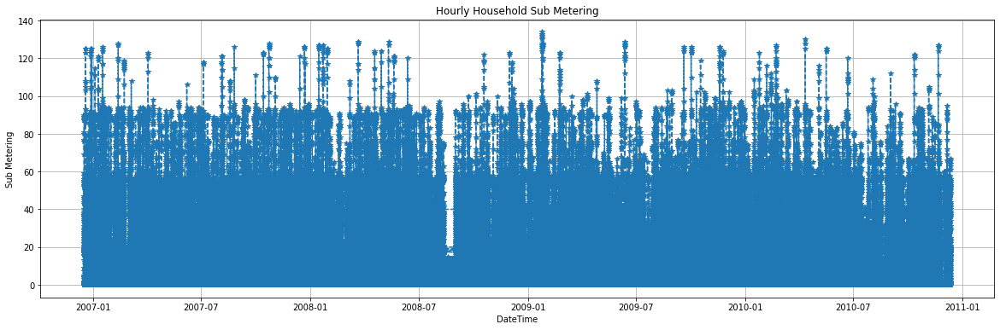

In [24]:
#Plot datetime X  average sub metering
plt.figure(figsize=(20,6))
plt.plot(df_power.index, df_power.sum_sm, '--', marker='*', )
plt.grid()
plt.title("Hourly Household Sub Metering")
plt.xlabel('DateTime')
plt.ylabel('Sub Metering')

Okay, Let's Make sense of this by Resampling the data into daily & weekly data

In [25]:
df_power.isna().sum()

gap        0
grp        0
voltage    0
gi         0
sm1        0
sm2        0
sm3        0
sum_sm     0
dtype: int64

In [26]:
#Resample to daily data
df_daily = df_power.resample("D").mean()

In [27]:
df_daily.shape

(1457, 8)

Text(0, 0.5, 'Sub Metering')

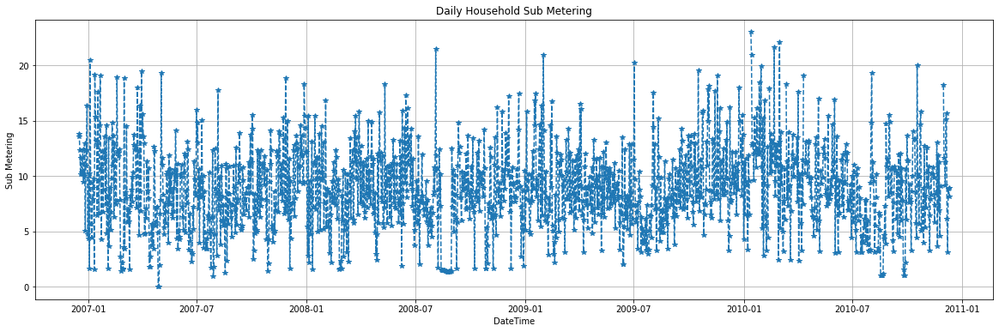

In [28]:
#Plot Daily datetime X  average sub metering
plt.figure(figsize=(20,6))
plt.plot(df_daily.index, df_daily.sum_sm, '--', marker='*', )
plt.grid()
plt.title("Daily Household Sub Metering")
plt.xlabel('DateTime')
plt.ylabel('Sub Metering')

In [29]:
#Resample to Weekly data
df_weekly = df_daily.resample("W").mean()

In [30]:
df_weekly.shape

(209, 8)

Text(0, 0.5, 'Sub Metering')

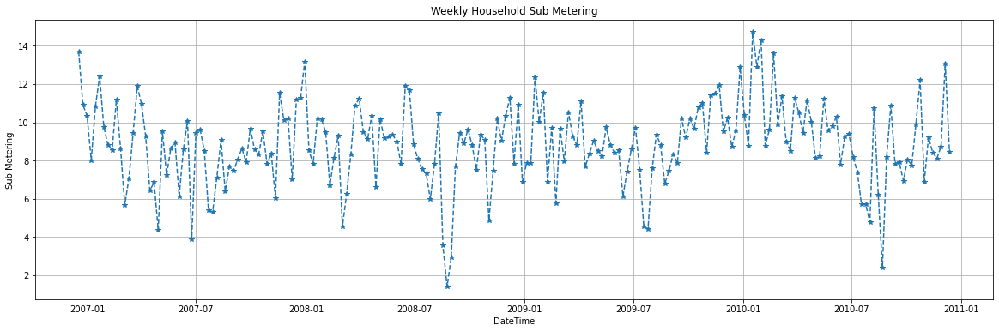

In [31]:
#Plot datetime X  average sub metering
plt.figure(figsize=(20,6))
plt.plot(df_weekly.index, df_weekly.sum_sm, '--', marker='*', )
plt.grid()
plt.title("Weekly Household Sub Metering")
plt.xlabel('DateTime')
plt.ylabel('Sub Metering')

Makes More sense! 

# Seasonality & Trend

In [32]:
df_seas = pd.DataFrame(df_power["sum_sm"])
df_seas.head()

,sum_sm
datetime,
2006-12-16 17:24:00,18.0
2006-12-16 17:25:00,17.0
2006-12-16 17:26:00,19.0
2006-12-16 17:27:00,18.0
2006-12-16 17:28:00,18.0


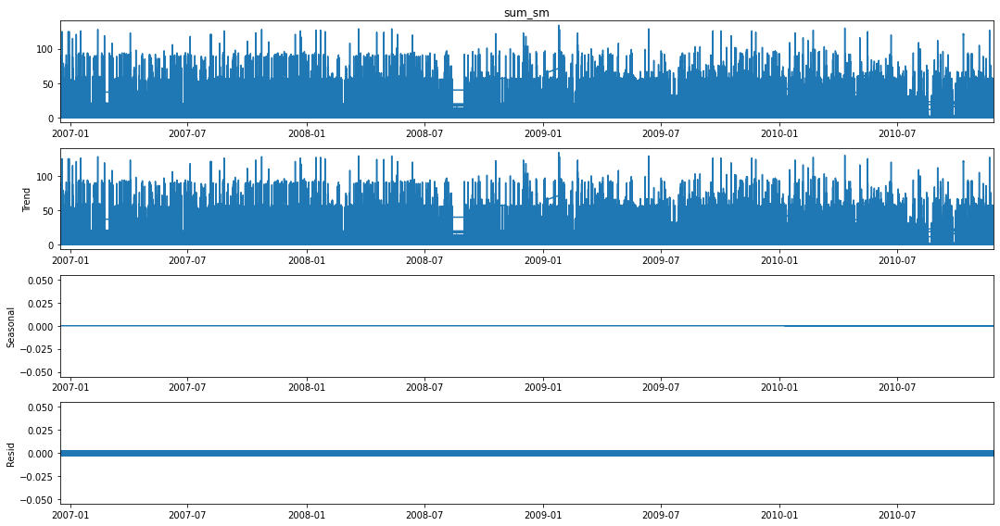

In [33]:
import statsmodels.api as sm
from pylab import rcParams
rcParams['figure.figsize'] = 15, 8
decompose_series = sm.tsa.seasonal_decompose(x = df_seas["sum_sm"], model='additive', period = 1)
decompose_series.plot()
plt.show()

In [34]:
#Interpolate Missing values for daily dataset
df_d = df_daily.sum_sm.interpolate()
df_d = pd.DataFrame(df_d)

In [35]:
df_d

,sum_sm
datetime,
2006-12-16,13.818182
2006-12-17,13.584028
2006-12-18,12.293056
2006-12-19,10.165278
2006-12-20,11.604861
...,...
2010-12-07,6.120833
2010-12-08,3.122222
2010-12-09,8.872222


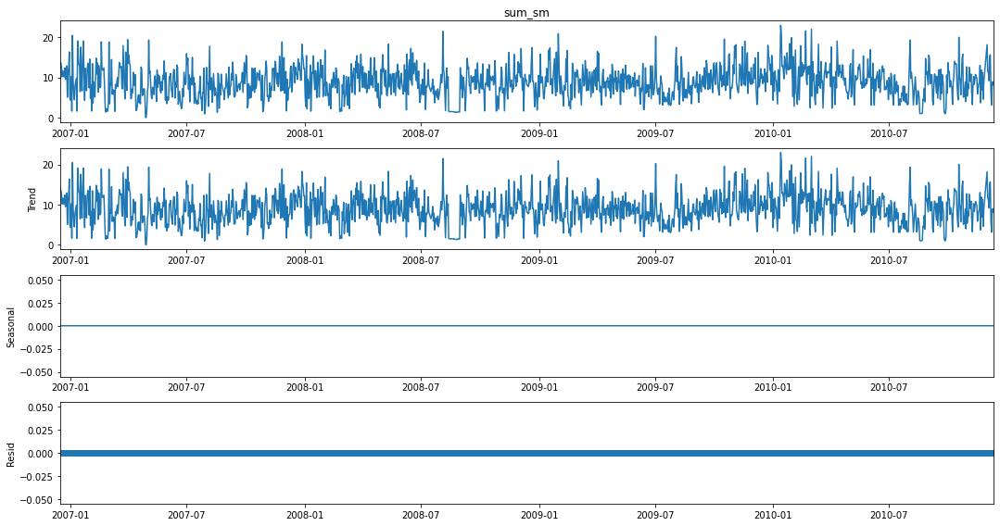

In [36]:
import statsmodels.api as sm
from pylab import rcParams
rcParams['figure.figsize'] = 15, 8
decompose_series = sm.tsa.seasonal_decompose(x = df_d["sum_sm"], model='additive', period = 1)
decompose_series.plot()
plt.show()

In [37]:
#Interpolate Missing values for weekly dataset
df_w = df_weekly.sum_sm.interpolate()
df_w = pd.DataFrame(df_w)

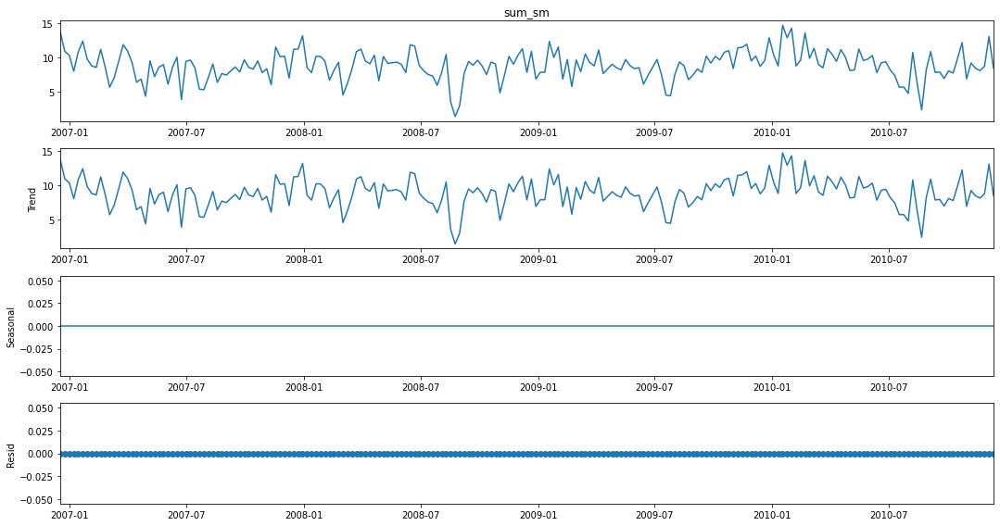

In [38]:
import statsmodels.api as sm
from pylab import rcParams
rcParams['figure.figsize'] = 15, 8
decompose_series = sm.tsa.seasonal_decompose(x = df_w["sum_sm"], model='additive', period = 1)
decompose_series.plot()
plt.show()

So Yeah, It's a stationary data. No Seasonality and no definite trend 

In [39]:
#Statistical check for seasonality & Trend Daily

from statsmodels.tsa.stattools import adfuller
adf = adfuller(df_d['sum_sm'])
print(f'ADF Statistic: {adf[0]}')
print(f'p-value: {adf[1]}')
print(f'No. of lags used: {adf[2]}')
print(f'No. of observations used : {adf[3]}')
print('Critical Values:')
for k, v in adf[4].items():
    print(f'   {k}: {v}') 

ADF Statistic: -13.736200759107057
p-value: 1.116170169599547e-25
No. of lags used: 3
No. of observations used : 1453
Critical Values:
   1%: -3.434858527373781
   5%: -2.8635312133080046
   10%: -2.567830105465636


pvalue is less than 0.05, hence data is STATIONARY

In [40]:
#Statistical check for seasonality & Trend Weekly

from statsmodels.tsa.stattools import adfuller
adf = adfuller(df_w['sum_sm'])
print(f'ADF Statistic: {adf[0]}')
print(f'p-value: {adf[1]}')
print(f'No. of lags used: {adf[2]}')
print(f'No. of observations used : {adf[3]}')
print('Critical Values:')
for k, v in adf[4].items():
    print(f'   {k}: {v}') 

ADF Statistic: -3.822657209793391
p-value: 0.002683825417636584
No. of lags used: 5
No. of observations used : 203
Critical Values:
   1%: -3.462980134086401
   5%: -2.875885461947131
   10%: -2.5744164898444515


pvalue is less than 0.05, hence data is STATIONARY

## Autocorrelation & Partial Functions

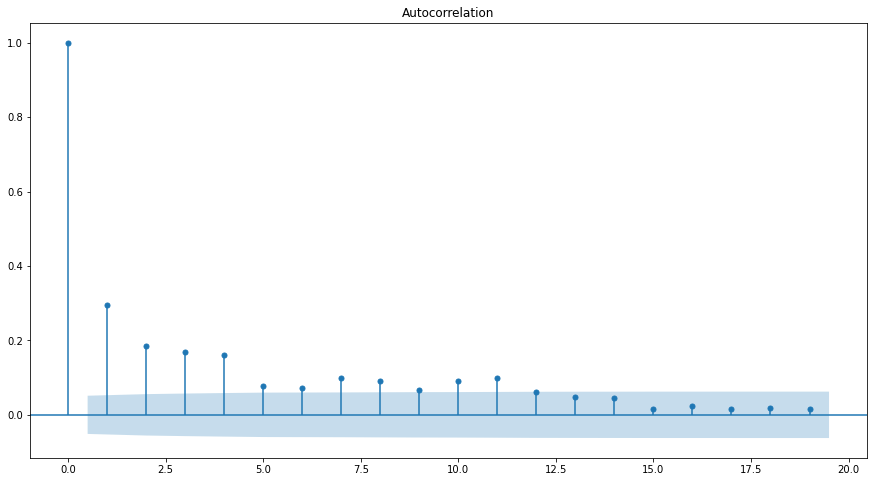

In [41]:
#acf Daily
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#ACF
plot_acf(df_d, lags = range(0, 20))
plt.show()


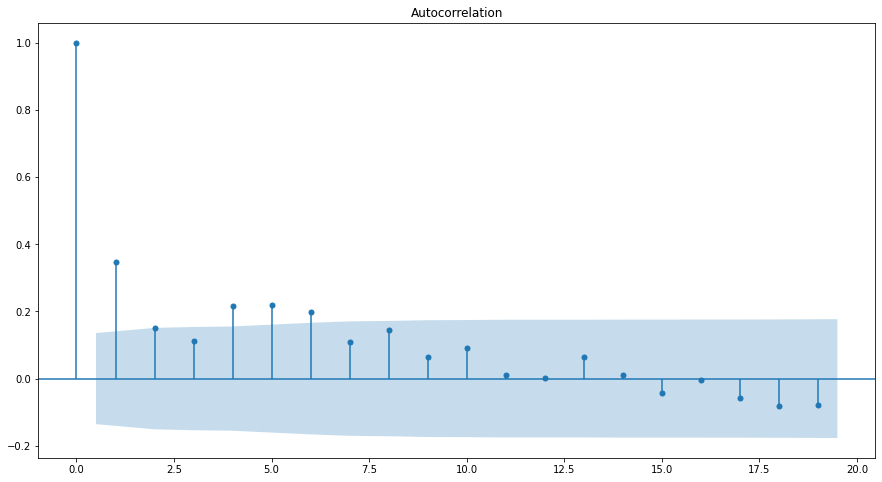

In [42]:
#acf Weekly
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#ACF
plot_acf(df_w, lags = range(0, 20))
plt.show()


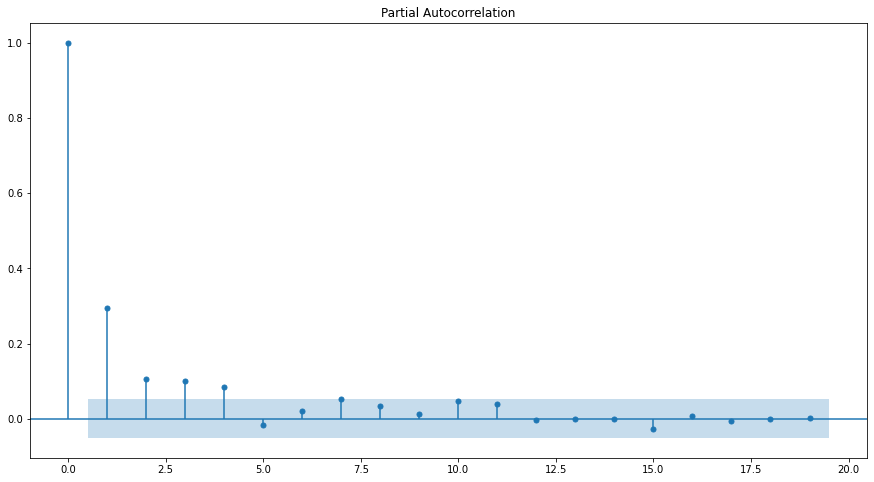

In [43]:
#PACF Daily
plot_pacf(df_d, lags = range(0, 20))
plt.show()

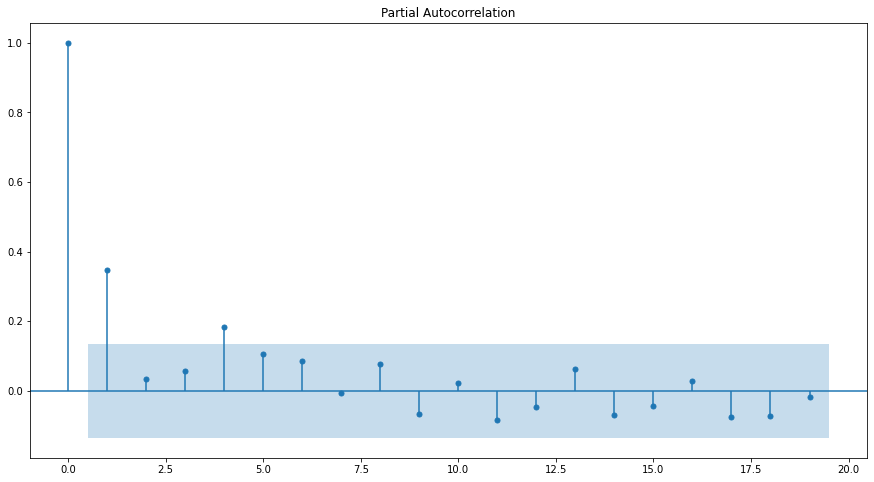

In [44]:
#PACF Weekly
plot_pacf(df_w, lags = range(0, 20))
plt.show()

# Models 

## Autoregressive Integrated Moving Average (ARIMA)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           12

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.71623D+00    |proj g|=  6.72351D-05

At iterate    5    f=  2.71623D+00    |proj g|=  6.21725D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      7     10      1     0     0   4.441D-08   2.716D+00
  F =   2.7162255514969176     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
 This problem is unconstrained.


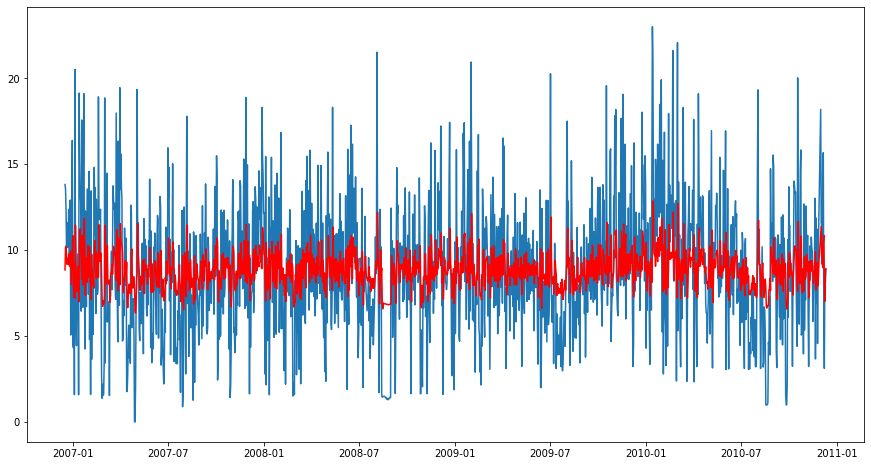

In [45]:
from statsmodels.tsa.arima_model import ARIMA
#Daily 

AR_model = ARIMA(df_d, order=(0,0,2))
AR_model_results = AR_model.fit()
plt.plot(df_d)
plt.plot(AR_model_results.fittedvalues, color='red')

In [46]:
#Evaluation

#MAE Daily
expected = df_d["sum_sm"]
predictions = AR_model_results.fittedvalues

mae = mean_absolute_error(expected, predictions)
print('MAE: %f' % mae)

MAE: 2.874998


In [47]:
def MAPE(expected,prediction):
    mape = np.mean(np.abs((expected - prediction)/expected))*100
    return mape

In [48]:
#MAPE daily
MAPE(expected, predictions)

inf

In [49]:
# RMSE Daily
MSE = mean_squared_error(expected, predictions)

RMSE = math.sqrt(MSE)
print("Mean Square Error: ",  MSE)

print("Root Mean Square Error: ",  RMSE)

Mean Square Error:  13.391406773689019
Root Mean Square Error:  3.6594271100390863


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           12

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.10462D+00    |proj g|=  2.67546D-03

At iterate    5    f=  2.10460D+00    |proj g|=  3.55271D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      8      1     0     0   0.000D+00   2.105D+00
  F =   2.1046028115162456     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
 This problem is unconstrained.


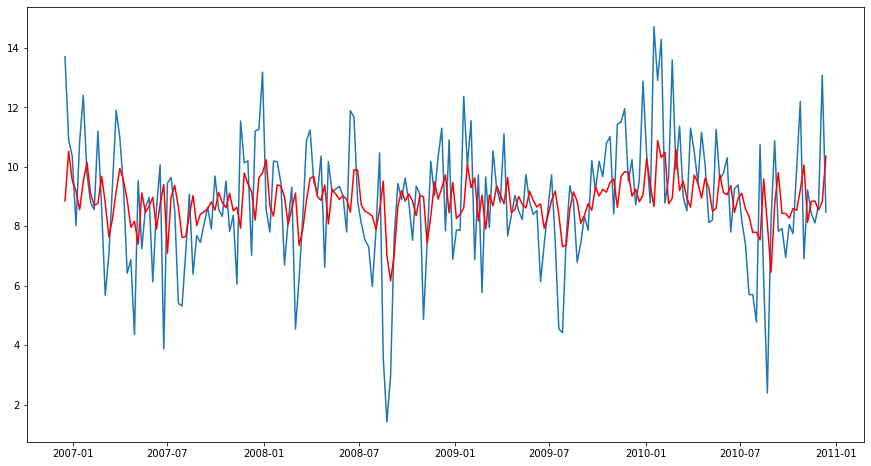

In [50]:
#Weekly

AR_model = ARIMA(df_w, order=(0,0,2))
AR_model_results = AR_model.fit()
plt.plot(df_w)
plt.plot(AR_model_results.fittedvalues, color='red')

In [51]:
#Evaluation

#MAE Weekly
expected = df_w["sum_sm"]
predictions = AR_model_results.fittedvalues

mae = mean_absolute_error(expected, predictions[:1457])
print('MAE: %f' % mae)

MAE: 1.504641


In [52]:
#MAPE daily
MAPE(expected, predictions)

21.630712805814657

In [53]:
# RMSE Daily
MSE = mean_squared_error(expected, predictions)

RMSE = math.sqrt(MSE)
print("Mean Square Error:\n",  MSE)

print("Root Mean Square Error:\n",  RMSE)

Mean Square Error:
 3.951609544743041
Root Mean Square Error:
 1.9878655751189618


## The Prophet

In [54]:
from fbprophet import Prophet
#rename columns as required

df_dd = df_d.reset_index()

Initial log joint probability = -31.899
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      87       1447.37    0.00115598       85.5584   1.401e-05       0.001      137  LS failed, Hessian reset 
      99       1447.42   8.74157e-05       79.0681      0.2208           1      155   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       1447.43     2.296e-05       81.7833   3.616e-07       0.001      269  LS failed, Hessian reset 
     199       1447.43   3.16685e-07        73.603      0.2205           1      320   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       1447.43    6.7766e-08       67.8379      0.5684      0.5684      334   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


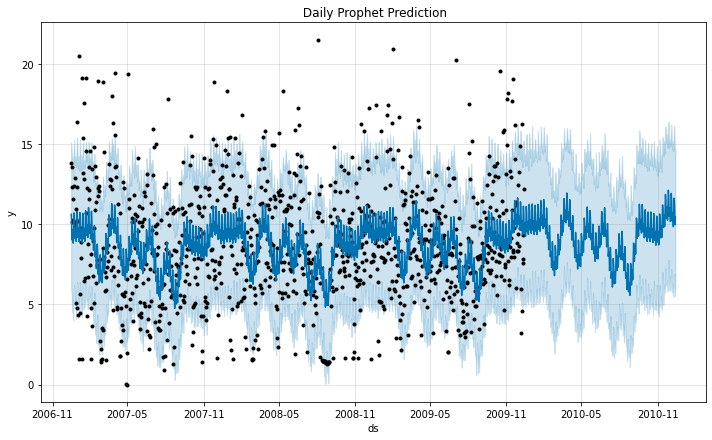

In [55]:
#Daily
df_dpro = df_dd.rename(columns={"datetime": "ds", "sum_sm": "y"})
df_dpro.head()

train = df_dpro[:1095]
test = df_dpro[-365:]

model = Prophet()
model.fit(train)

#predict for the next 365 days
future = model.make_future_dataframe(periods=365, freq='D') 
forecastd = model.predict(future) 
forecastd.head()
forecastd[['ds', 'yhat', 'yhat_lower', 'yhat_upper', 'trend', 'trend_lower', 'trend_upper']]
#yhat is the prediction while yhat_lower and yhat_upper are the upper and lower boundaries


model.plot(forecastd)
plt.title(" Daily Prophet Prediction")
plt.show()

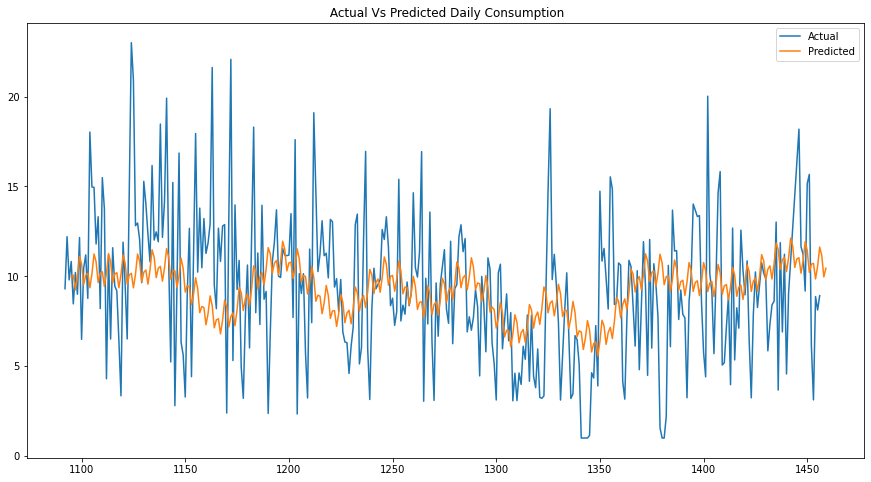

In [56]:
# plot expected vs actual
plt.plot(test["y"], label='Actual')
plt.plot(forecastd["yhat"][-365:], label='Predicted')
plt.legend()
plt.title(" Actual Vs Predicted Daily Consumption")
plt.show()

In [57]:
#Evaluation
def MAPE(expected,prediction):
    mape = np.mean(np.abs((expected - prediction)/expected))*100
    return mape

In [58]:
#MAE Daily
expected = test["y"]
predictions = forecastd["yhat"][-365:]

mae = mean_absolute_error(expected, predictions)
print('MAE: %f' % mae)

MAE: 3.092443


In [59]:
#MAPE Daily
MAPE(expected, predictions)

55.09951600085496

In [60]:
# RMSE Daily
MSE = mean_squared_error(expected, predictions)

RMSE = math.sqrt(MSE)
print("Mean Square Error:\n",  MSE)

print("Root Mean Square Error:\n",  RMSE)


Mean Square Error:
 15.64735304716828
Root Mean Square Error:
 3.9556735263628977


In [61]:
df_w.shape

(209, 1)

Initial log joint probability = -9.48478
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       297.531   1.39069e-06       55.1128      0.5286      0.5286      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       297.566   0.000130846       83.2455   1.412e-06       0.001      276  LS failed, Hessian reset 
     199       297.597   6.33035e-06       57.8852      0.6486      0.6486      315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       297.599   7.08705e-06       42.8063   9.516e-08       0.001      372  LS failed, Hessian reset 
     241       297.599   1.67512e-09       74.4269     0.04767     0.04767      419   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


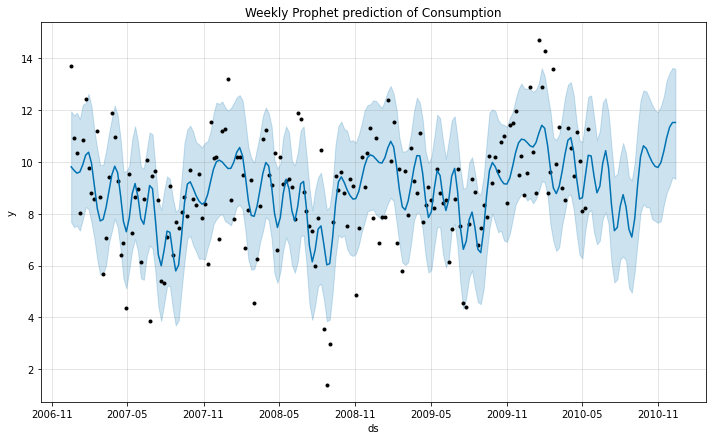

In [62]:
#wEEKLY

#rename columns as required

df_ww = df_w.reset_index()
df_wpro = df_ww.rename(columns={"datetime": "ds", "sum_sm": "y"})
df_wpro.head()


train = df_wpro[:179]
test = df_wpro[-30:]

model = Prophet()
model.fit(train)

#predict for the next 30 weeks
future = model.make_future_dataframe(periods=30, freq='W') 
forecast = model.predict(future) 
forecast.head()
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper', 'trend', 'trend_lower', 'trend_upper']]
#yhat is the prediction while yhat_lower and yhat_upper are the upper and lower boundaries


model.plot(forecast)
plt.title("Weekly Prophet prediction of Consumption")
plt.show()

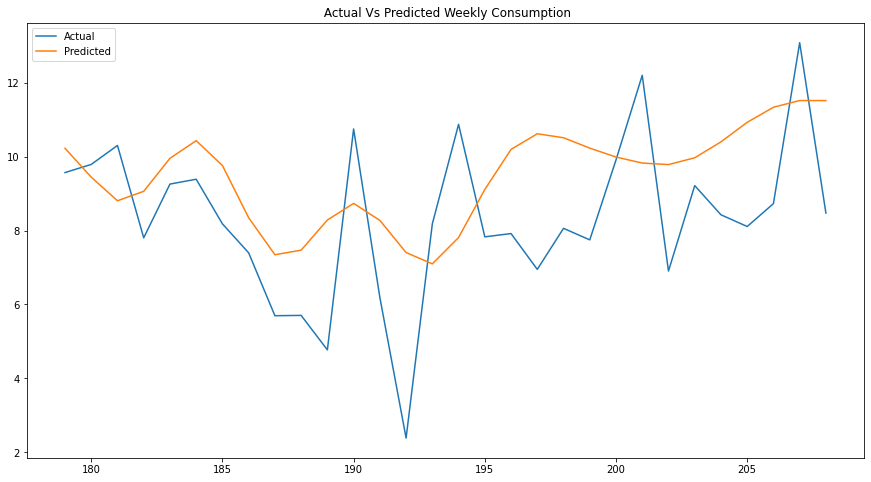

In [63]:
# plot expected vs actual
plt.plot(test["y"], label='Actual')
plt.plot(forecast["yhat"][-30:], label='Predicted')
plt.legend()
plt.title(" Actual Vs Predicted Weekly Consumption")
plt.show()

In [64]:
#Evaluate Weekly

#MAE
expect = test["y"]
pred = forecast["yhat"]

mae = mean_absolute_error(expect, pred[-30:])
print('MAE: %f' % mae)

MAE: 1.948482


In [65]:
#Weekly MAPE
MAPE(expect, pred)

29.851198432025278

In [66]:
# RMSE Weekly
MSE = mean_squared_error(expect, pred[-30:])

RMSE = math.sqrt(MSE)
print("Mean Square Error:\n",  MSE)

print("Root Mean Square Error:\n",  RMSE)

Mean Square Error:
 4.9633528054945355
Root Mean Square Error:
 2.2278583450243277


## **THE END**